# IoT device identification dataset
### *Source: https://www.kaggle.com/datasets/fanbyprinciple/iot-device-identification*

#### Given a dataset of IoT device behaviour and network data, is it possible to build a classifier that can identify IoT devices on a network?

This is part of 1 of *x* (currently 2) lab worksheets within which I attempt to build a multilabel classifer than can identify IoT devices on a network. The following topics are covered in part 1:
1. Data preprocessing
2. Data linearity plotting

## Imbooorts

In [1]:
# full package imports
import os
import warnings
import graphviz
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# module imports - plotting
from plotly.subplots import make_subplots
from matplotlib.pylab import rcParams

# module imports - preprocessing
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler, RobustScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram

# module imports - model building
from joblib import parallel_backend
from sklearn.model_selection import GridSearchCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.svm import SVC
from xgboost import XGBClassifier, plot_tree, plot_importance

# module imports - model refinement
from sklearn.feature_selection import RFECV
from statsmodels.stats.outliers_influence import variance_inflation_factor

# module imports - model evaluation
from sklearn.metrics import balanced_accuracy_score, multilabel_confusion_matrix, roc_auc_score, roc_curve, auc

# custom imports
from rs_funcs import data_manip as dm

%matplotlib inline
warnings.filterwarnings("ignore")
os.getcwd()

D:\Mambaforge\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


'D:\\Mambaforge\\.jupyter\\Practice Datasets'

## Begin 

In [2]:
df_train = pd.read_csv("iot_device_train.csv")
df_test = pd.read_csv("iot_device_test.csv")

print(df_train.shape)
print(df_test.shape)

(1000, 298)
(900, 298)


Rather than juggling around 2 datasets for whatever reason let's combine them into one and do all of our work on the big one. Later on we can use the original df_test for validation.

In [3]:
df_big = pd.concat([df_train, df_test], ignore_index = True)
dm.data_viewer(df_big)


--------------------
Shape:
--------------------
(1900, 298)

--------------------
Head:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Tail:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Summary:
--------------------


,ack,ack_A,ack_B,bytes,bytes_A,bytes_A_B_ratio,bytes_B,ds_field_A,ds_field_B,duration,http_GET,http_POST,http_bytes_avg,http_bytes_entropy,http_bytes_firstQ,http_bytes_max,http_bytes_median,http_bytes_min,http_bytes_stdev,http_bytes_sum,http_bytes_thirdQ,http_bytes_var,http_cookie_count,http_cookie_values_avg,http_cookie_values_entropy,http_cookie_values_firstQ,http_cookie_values_max,http_cookie_values_median,http_cookie_values_min,http_cookie_values_stdev,http_cookie_values_sum,http_cookie_values_thirdQ,http_cookie_values_var,http_count_host,http_count_req_content_type,http_count_resp_code,http_count_resp_content_type,http_count_transactions,http_count_user_agents,http_dom_host_alexaRank,http_dom_resp_code,http_has_location,http_has_referrer,http_has_req_content_type,http_has_resp_content_type,http_has_user_agent,http_inter_arrivel_avg,http_inter_arrivel_entropy,http_inter_arrivel_firstQ,http_inter_arrivel_max,http_inter_arrivel_median,http_inter_arrivel_min,http_inter_arrivel_stdev,http_inter_arrivel_sum,http_inter_arrivel_thirdQ,http_inter_arrivel_var,http_req_bytes_avg,http_req_bytes_entropy,http_req_bytes_firstQ,http_req_bytes_max,http_req_bytes_median,http_req_bytes_min,http_req_bytes_stdev,http_req_bytes_sum,http_req_bytes_thirdQ,http_req_bytes_var,http_resp_bytes_avg,http_resp_bytes_entropy,http_resp_bytes_firstQ,http_resp_bytes_max,http_resp_bytes_median,http_resp_bytes_min,http_resp_bytes_stdev,http_resp_bytes_sum,http_resp_bytes_thirdQ,http_resp_bytes_var,http_time_avg,http_time_entropy,http_time_firstQ,http_time_max,http_time_median,http_time_min,http_time_stdev,http_time_sum,http_time_thirdQ,http_time_var,packet_inter_arrivel_A_avg,packet_inter_arrivel_A_entropy,packet_inter_arrivel_A_firstQ,packet_inter_arrivel_A_max,packet_inter_arrivel_A_median,packet_inter_arrivel_A_min,packet_inter_arrivel_A_stdev,packet_inter_arrivel_A_sum,packet_inter_arrivel_A_thirdQ,packet_inter_arrivel_A_var,packet_inter_arrivel_B_avg,packet_inter_arrivel_B_entropy,packet_inter_arrivel_B_firstQ,packet_inter_arrivel_B_max,packet_inter_arrivel_B_median,packet_inter_arrivel_B_min,packet_inter_arrivel_B_stdev,packet_inter_arrivel_B_sum,packet_inter_arrivel_B_thirdQ,packet_inter_arrivel_B_var,packet_inter_arrivel_avg,packet_inter_arrivel_entropy,packet_inter_arrivel_firstQ,packet_inter_arrivel_max,packet_inter_arrivel_median,packet_inter_arrivel_min,packet_inter_arrivel_stdev,packet_inter_arrivel_sum,packet_inter_arrivel_thirdQ,packet_inter_arrivel_var,packet_size_A_avg,packet_size_A_entropy,packet_size_A_firstQ,packet_size_A_max,packet_size_A_median,packet_size_A_min,packet_size_A_stdev,packet_size_A_sum,packet_size_A_thirdQ,packet_size_A_var,packet_size_B_avg,packet_size_B_entropy,packet_size_B_firstQ,packet_size_B_max,packet_size_B_median,packet_size_B_min,packet_size_B_stdev,packet_size_B_sum,packet_size_B_thirdQ,packet_size_B_var,packet_size_avg,packet_size_entropy,packet_size_firstQ,packet_size_max,packet_size_median,packet_size_min,packet_size_stdev,packet_size_sum,packet_size_thirdQ,packet_size_var,packets,packets_A,packets_A_B_ratio,packets_B,push,push_A,push_B,reset,reset_A,reset_B,ssl_count_certificates,ssl_count_client_cipher_algs,ssl_count_client_ciphersuites,ssl_count_client_compressions,ssl_count_client_elliptic_curves,ssl_count_client_key_exchange_algs,ssl_count_client_mac_algs,ssl_count_server_ciphersuite,ssl_count_server_compression,ssl_count_server_elliptic_curve,ssl_count_server_name,ssl_count_transactions,ssl_count_version,ssl_dom_server_ciphersuite,ssl_dom_server_name_alexaRank,ssl_dom_version,ssl_handshake_duration_avg,ssl_handshake_duration_entropy,ssl_handshake_duration_firstQ,ssl_handshake_duration_max,ssl_handshake_duration_median,ssl_handshake_duration_min,ssl_handshake_duration_stdev,ssl_handshake_duration_sum,ssl_handshake_duration_thirdQ,ssl_handshake_duration_var,ssl_ratio_client_elliptic_curves,ssl_ratio_server_name,ssl_req_bytes_avg,ssl_req_bytes_entropy,ssl_req_bytes_firstQ,ssl_req_bytes_max,ssl_req_bytes_me


--------------------
Data types:
--------------------
int64      174
float64    123
object       1
dtype: int64

--------------------
Null values:
--------------------
0    298
dtype: int64

--------------------
Uniques:
--------------------
44 columns have 1 unique value(s) [14.77%]
47 columns have 2 unique value(s) [15.77%]
17 columns have 3 unique value(s) [5.70%]
14 columns have 4 unique value(s) [4.70%]




Let's use a copy of our original dataset for our further EDA and operations. We can separate our target variable later on when we need to.

In [4]:
df_cp = df_big.copy()
print(df_cp.shape)

(1900, 298)


Some features have only 1 unique value. Features like this with only 1 value throughout their length will have extreme correlations with other features and their target contributions will be evenly distributed 100% across every target class. We can remove them without a second thought.

In [5]:
r_cols = dm.u_count(df_cp, 1, exact = True)
len(r_cols)

44

In [6]:
df_cp.drop(r_cols, axis = 1, inplace = True)
df_cp.shape

(1900, 254)

Now that we have a slightly smaller dataset, let's make some initial observations about it:
1. There are multiple target classes (up to 10 levels), so on dimensions lower than 10 this data is not linearly separable. Therefore we can build our model in the following ways (not limiting):
    1. Discriminant Analysis (quadratic/linear DA can also be used to verify a quadratic/linear decision surface)
    2. A SVC, either hard or soft (depending on this outcome we'll know whether, even in 10 dimensions, this data linearly separable or not)
    3. Decision tree classifiers and family (boosted/bagged/stacked trees, forests, rainforests, savannahs, what-have-you, etc.) which are "agnostic" to dimensionality in a sense.
    4. An artifical neural network (a single perceptron is guaranteed to find a linearly separable plane, so multiple perceptrons should either be able to perform OVR or better, classify simultaneously.)
2. With 200+ features, data dimensionality is high. Given point (1), it might be safe to assume that there can be non-linear relationships within features and between features and the target classes. We can approach this in 2 ways: regularisation to prevent information loss via dimensionality reduction, or multivariate dimensionality reduction (again, in 2 ways but using a control group):
    1. PCA will be our control group with a plot of its first 3 components.
    2. LLE, Spectral Clustering and Isomap will be our comparators:
        1. LLE (LTSE) is a series of local PCAs that are globally compared to find the best non-linear mapping.
        2. SC preserves local dissimilarity using KNN & Laplacian eigenmaps and so might keep our feature relations intact against each other.
        3. Isomap, which extends MDS from Euclidean distances to geodesic distances, preserves global dissimilarity so this might keep our feature relations to the target intact against each other.
    3. t-SNE can be used to visualise our local neighbourhoods at the cost of global organisation.
3. It has binomial columns that contribute to its high dimensionality. We can separate these out, see what they're like and transform them somehow if required.
4. Most of the features are heavily skewed and/or kurtic, which can be inferred from the position of their median relative to their mean. We should absolutely log transform this data before handling it in order to bring it more towards a normal distribution as much as possible.
5. There are features that seem to be temporal or durational in nature: \*\_time_avg, \*\_inter_avg, duration, etc. These features can either be extracted and handled as temporal (binned), or they can be left as is because they are also statistical (average time, max time, first quartile of bytes, median bytes, etc.), or they can be engineered into \*\_per_time type of features.

Additionally, interestingly almost all of the features appear to be statistical: \*\_avg, \*\_median, \*\_firstQ, etc. We *could* try to reconstruct a statistical series using these features as locations and have the series oriented according to the target class (instead of http_avg, http_median, http_firstQ, etc. for each target class we can simply have one complete http series for one class with avg == http_avg, median == http_median, etc.) What we could accomplish with this approach is rather unclear at the moment, so we'll leave this for a later experiment.

Let's begin with separating our binomials and then verifying some of our data's relationships with itself. We'll use 3d plots coloured by our target levels to get a feel for what our data looks like, but given that we have ~250 columns, we'll just breeze through a few of them to get an idea (CLT working irl and all that.)

In [7]:
b_cols = dm.u_count(df_cp, 2, exact = True)
len(b_cols)

47

In [8]:
df_binom = df_cp.loc[:, b_cols]
df_cp.drop(b_cols, axis = 1, inplace = True)

print("Binomial data:", df_binom.shape)
print("Data copy shape:", df_cp.shape)

Binomial data: (1900, 47)
Data copy shape: (1900, 207)


Real quick before we move on, let's preprocess our binomials a little bit. Instead of outright removing the skewed binomials, let's see how they impact our target column. We need every column individually against the target to see the target distribution (aka contributions) of the majority/minority values.

In [9]:
sk_cols = dm.u_skew(df_binom)
print("Skewed binomials:", len(sk_cols))

Skewed binomials: 23


In [10]:
dm.get_contrib(df_binom[sk_cols], df_cp["device_category"])

Column "http_GET" value "1" has these contributors:
--------------------
motion_sensor      0.587879
security_camera    0.206061
TV                 0.175758
thermostat         0.018182
smoke_detector     0.012121
Name: device_category, dtype: float64 



Column "http_POST" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64 



Column "http_has_location" value "1" has these contributors:
--------------------
baby_monitor    1.0
Name: device_category, dtype: float64 



Column "http_has_referrer" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64 



Column "ssl_ratio_client_elliptic_curves" value "1" has these contributors:
--------------------
security_camera    1.0
Name: device_category, dtype: float64 



Column "is_numeric_url_http" value "1" has these contributors:
--------------------
motion_sens

It looks like most of our skewed binomials' minority values associate with an acceptable amount of target observations. We should not remove these regardless of their skew, but we can remove those skewed binomials that have their minority contribute to only 1 target value because they hold no usable information: majority values will always associate with multiple target classes due to their majority status, but minorities associating with only 1 target class simply imply that the entire column has extreme correlation with other features.

In [11]:
r_cols = ["http_has_location", "ssl_ratio_client_elliptic_curves",
          "is_numeric_url_with_port_http", "is_tv_http", "is_cloud_http",
          "B_is_dynamic_and_or_private_port", "B_port_is_11095",
          "B_port_is_1900", "B_port_is_5228", "subdomain_is_www",
          "subdomain_is_www.cloud", "domain_is_dlink",
          "domain_is_proteussensor"]

df_binom.drop(r_cols, axis = 1, inplace = True)
df_binom.shape

(1900, 34)

Now that we've removed our truly skewed binomial features, we can use the remaining ones as though they are dummified categories. At this point we could also dummify our target variable and add it on here, but that would a slight misjudgement: dummifying before splitting into train/test splits causes issues later on with lining up the splits. Also as a small aside, OHE is a better dummifier rather than pd.get_dummies only because OHE allows us to use a persistent function that can handle unknown features later on - it can be instantiated, then learn the encoding of certain data for later application using transform() - whereas pd.get_dummies doesn't instantiate and so will be able to transform unknown features much to the breaking of our model later on. This is far from saying that get_dummies is useless: it adds tremendous value for quick analyses, amongst other use cases.

**[Future me]:** OHE is great and all but our categories actually end up being a `(n_rows * 10)` matrix because we have 10 classes and GridSearchCV can't digest that (it wants a 1D array), so a better thing to do would be labelencoding.

It seems that some of binomials are actually 100% synergistic with others: they have 1s and 0s where another column also has 1s and 0s perfectly. There is quite a lot of redundancy here which we is low-hanging fruit for dimensionality reduction. There are also some binomials that are 100% antagonistic with others: they have 1s and 0s where another column has 0s and 1s perfectly. Although there is a degree of redundancy here too, keeping only one of the antagonstic columns and dropping the others makes inferring the existence of the dropped columns a little difficult. In other words, this isn't the same case as OHEing a target feature and dropping the first column due to redundancy (at least superficially.) Therefore antagonstic columns will be left as they are.

In [12]:
# We're looking for columns that have exactly the same values as another column
# does. This means that every value in column A has to match column B, in which
# case we can remove either A or B. One way to do this is using booleans: if
# the value in col(A) == col(B), the element check will return True. If the sum
# of all the booleans == the length of the column, we have an exact match.

# We could do it using a dataframe too, like so:

# col_arr = []
# match_df = pd.DataFrame(columns = df_binom.columns, index = df_binom.columns)
# for col in df_binom.columns:
#     for subcol in df_binom.columns:
#         if col == subcol:
#             col_arr.append(1)
#         else:
#             col_arr.append(sum(df_binom[col] == df_binom[subcol]))
#     match_df[col] = col_arr
#     col_arr.clear()
# with pd.option_context("display.max_columns", df_binom.shape[1],
#                        "display.max_rows", df_binom.shape[0]):
#    display(match_df)

# but this approach makes it quite difficult to figure out which columns are
# replicated by which other columns especially if one column matches up with
# more than 2 other ones. A simplified for-loop should be adequate enough:

for col in df_binom.columns:
    print(col, "\n--------------------")
    for subcol in df_binom.columns:
        if col == subcol:
            continue
        else:
            if (sum(df_binom[col] == df_binom[subcol])) == len(df_binom[col]):
                print(sum(df_binom[col] == df_binom[subcol]), "\t[{}]".format(subcol))
    print("\n")

http_GET 
--------------------


http_POST 
--------------------
1900 	[http_has_referrer]


http_count_host 
--------------------
1900 	[http_count_req_content_type]
1900 	[http_count_user_agents]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_count_req_content_type 
--------------------
1900 	[http_count_host]
1900 	[http_count_user_agents]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_count_user_agents 
--------------------
1900 	[http_count_host]
1900 	[http_count_req_content_type]
1900 	[http_has_req_content_type]
1900 	[http_has_resp_content_type]
1900 	[http_has_user_agent]
1900 	[is_http]


http_has_referrer 
--------------------
1900 	[http_POST]


http_has_req_content_type 
--------------------
1900 	[http_count_host]
1900 	[http_count_req_content_type]
1900 	[http_count_user_agents]
1900 	[http_has_resp_content_type]
1900 	[http_h

Alright well that yielded some good results: it appears that some columns have the exact same values throughout their length as a few others do, which means we can keep only 1 of them. But before we remove the ones we don't really need let's just double-check and make sure that the redundant columns we're removing contribute in the exacty same way to the target feature (device_category) as the source columns do.

In [13]:
dup_dict = {"http_POST": ["http_has_referrer"],
            "http_count_host": ["http_count_req_content_type",
                                "http_count_user_agents",
                                "http_has_req_content_type",
                                "http_has_resp_content_type",
                                "http_has_user_agent",
                                "is_http"],
            "ssl_count_client_compressions": ["ssl_count_server_ciphersuite",
                                              "ssl_count_server_compression",
                                              "ssl_count_server_elliptic_curve",
                                              "ssl_count_server_name",
                                              "ssl_count_transactions",
                                              "ssl_count_version",
                                              "ssl_ratio_server_name",
                                              "is_ssl"],
            "is_numeric_url_http": ["subdomain_is_unresolved",
                                    "domain_is_unresolved",
                                    "suffix_is_unresolved"]}

for item in dup_dict.items():
    dm.get_contrib(df_binom[item[0]], df_cp["device_category"])
    for subitem in item[1]:
        dm.get_contrib(df_binom[subitem], df_cp["device_category"])
    print("\n")

Column "http_POST" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64
Column "http_has_referrer" value "1" has these contributors:
--------------------
motion_sensor    0.913043
TV               0.086957
Name: device_category, dtype: float64


Column "http_count_host" value "1" has these contributors:
--------------------
motion_sensor      0.693277
security_camera    0.142857
TV                 0.130252
thermostat         0.012605
baby_monitor       0.012605
smoke_detector     0.008403
Name: device_category, dtype: float64
Column "http_count_req_content_type" value "1" has these contributors:
--------------------
motion_sensor      0.693277
security_camera    0.142857
TV                 0.130252
thermostat         0.012605
baby_monitor       0.012605
smoke_detector     0.008403
Name: device_category, dtype: float64
Column "http_count_user_agents" value "1" has these contributors:
------------

Great, now we can definitely go ahead and remove the columns we no longer require. Let's also real quick check our target variable's distribution before moving on.

In [14]:
# You want to be "Pythonic"? Because this is how you be completely unreadable,
# roundabout and unclear in what you want to accomplish (aka "Pythonic") >_>

df_binom.drop(list(np.concatenate(list(dup_dict.values()))), axis = 1, inplace = True)
df_binom.shape

(1900, 16)

Target data shape:
------------------------------
(1900,)
------------------------------

Target data distribution:
------------------------------
security_camera    200
TV                 200
smoke_detector     200
thermostat         200
watch              200
baby_monitor       200
motion_sensor      200
lights             200
socket             200
water_sensor       100
Name: device_category, dtype: int64
------------------------------

Target data countplot:
------------------------------
------------------------------



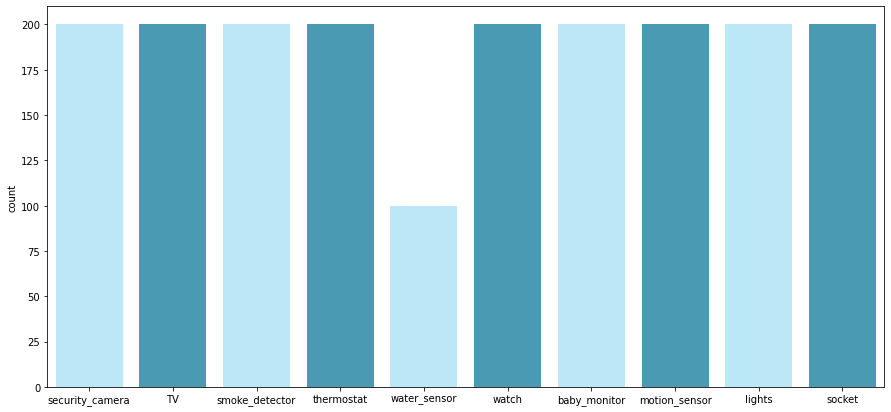

In [15]:
print("Target data shape:")
print("------------------------------")
print(df_cp["device_category"].shape)
print("------------------------------\n")

print("Target data distribution:")
print("------------------------------")
print(df_cp["device_category"].value_counts())
print("------------------------------\n")

print("Target data countplot:")
print("------------------------------")
plt.figure(figsize = (15, 7))
sns.countplot(data = df_cp["device_category"],
              x = df_cp["device_category"].values,
              palette = ["#b3ecff", "#39a3c6"]);
print("------------------------------\n")

Now that we have binomials that are not skewed and do not overlap we can proceed onto processing our numerical/temporal features. We don't have much to do in terms of trimming anymore skew because we've already removed columns that had only 1 unique value and separated out our binomials. Therefore the only features left have 3 or more unique values, which is acceptable, and their target contributions would also preclude them from removal.

So instead let's begin with plotting our data's relationships with itself and our target variable.

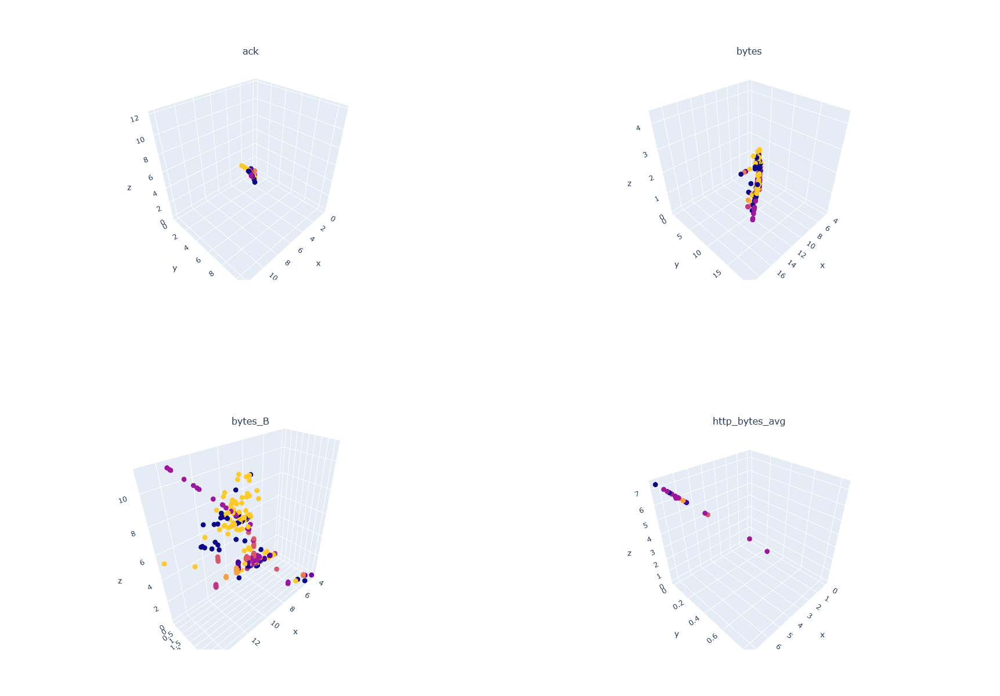

In [16]:
# we should first prepare our dataframe for plotting:
# > log(1 + x) all numerical data so that we don't have wild numbers
# > labelencode our target column for easy colouring
# > concatenate both into one dataframe

targ_3d = df_cp["device_category"]
lenc = LabelEncoder()
lenc.fit(targ_3d)
targ_3d = lenc.transform(targ_3d)
targ_3d = pd.Series(targ_3d, name = "device_category")

df_3d = df_cp.drop(["device_category"], axis = 1).copy()
df_3d = np.log1p(df_3d)
df_3d = pd.concat([df_3d, targ_3d], axis = 1)

del(targ_3d)

# now we prepare our plotting surface using plotly:
# > initialise a 2x2 subplot surface
# > populate every (row, col) with a 3d scatterplot coloured by our target

fig = make_subplots(rows = 2, cols = 2,
                    specs = [[{"type": "Scatter3d"}, {"type": "Scatter3d"}],
                             [{"type": "Scatter3d"}, {"type": "Scatter3d"}]],
                    subplot_titles = (df_3d.columns[0], df_3d.columns[3],
                                      df_3d.columns[6], df_3d.columns[9]))

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 0],
                 y = df_3d.iloc[:, 1],
                 z = df_3d.iloc[:, 2],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 1, col = 1
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 3],
                 y = df_3d.iloc[:, 4],
                 z = df_3d.iloc[:, 5],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 1, col = 2
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 6],
                 y = df_3d.iloc[:, 7],
                 z = df_3d.iloc[:, 8],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 2, col = 1
)

fig.add_trace(
    go.Scatter3d(x = df_3d.iloc[:, 9],
                 y = df_3d.iloc[:, 10],
                 z = df_3d.iloc[:, 11],
                 mode = "markers",
                 marker_size = 5,
                 marker_color = df_3d["device_category"]),
    row = 2, col = 2
)

fig.update_layout(height = 1200, showlegend = False)
fig.show()

Using our 3d scatters we can see that some columns are so entangled they're basically quantum states in terms of separability in 3D, but they do have some rather interesting linear relationships with the sister columns they've been plotted with. What's coming up might get a little messy, but let's Just Do It<sup>tm</sup>: we'll pairplot some portions of our dataset with regression lines to see what kind of relationships our data has. We'll also get a good glimpse at how the relationship our features have with our targets as well as our features' distributions after logging and standardising them.

**[Future me]:** originally the plot diagonal was supposed to be a KDE, but apparently the 8th feature doesn't play well with KDEs compared to histograms because it raises a `singular matrix` error (see 
<a href="https://github.com/mwaskom/seaborn/issues/1502">issue 1502</a>, corresponding with <a href="https://github.com/mwaskom/seaborn/pull/1823">pull 1823</a>): apparently the `kdeplot` fails when any of the variables is integer (or discrete with large bin sizes). The average k-nearest distance is then 0 (for not too large `k`), which then screws over the kernel width estimation of the KDE (for a more detailed explanation, see <a href="https://stats.stackexchange.com/questions/89754/statsmodels-error-in-kde-on-a-list-of-repeated-values">this SX discussion.</a>)

In [17]:
sns.pairplot(data = pd.concat([df_3d.iloc[:, :10], df_3d["device_category"]], axis = 1),
             kind = "reg",
             diag_kind = "hist",
             corner = True,
             hue = "device_category",
             size = 10,
             plot_kws = {"ci": None});

In [18]:
sns.pairplot(data = pd.concat([df_3d.iloc[:, 25:35], df_3d["device_category"]], axis = 1),
             kind = "reg",
             diag_kind = "hist",
             corner = True,
             hue = "device_category",
             size = 10,
             plot_kws = {"ci": None});

In [19]:
sns.pairplot(data = pd.concat([df_3d.iloc[:, 70:80], df_3d["device_category"]], axis = 1),
             kind = "reg",
             diag_kind = "hist",
             corner = True,
             hue = "device_category",
             size = 10,
             plot_kws = {"ci": None});

In [20]:
sns.pairplot(data = pd.concat([df_3d.iloc[:, 125:135], df_3d["device_category"]], axis = 1),
             kind = "reg",
             diag_kind = "hist",
             corner = True,
             hue = "device_category",
             size = 10,
             plot_kws = {"ci": None});

In [21]:
sns.pairplot(data = pd.concat([df_3d.iloc[:, 195:205], df_3d["device_category"]], axis = 1),
             kind = "reg",
             diag_kind = "hist",
             corner = True,
             hue = "device_category",
             size = 10,
             plot_kws = {"ci": None});

These were rather revealing: some taget variables have linear relationships to some features (and some features are linearly related with themselves and/or others) but overall they're very non-linear and very messy. It also appears that (at least in terms of the shape of the scatter, not the regression lines) some of our features are exponentially related to our target. In the next part, let's have a quick look at our distributions before checking out a QQ plot, the latter should be very informative!